<a href="https://colab.research.google.com/github/fsicardir/tp2_modelos/blob/main/tp2_modelos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import requests
import networkx as nx
import matplotlib.pyplot as plt
import heapq
import random
from google.colab import files


In [2]:
def add_incompat(incompatibilities, name1, name2):
  incomp = incompatibilities.get(name1, set()) | {name2}
  incompatibilities[name1] = incomp

def add_time(times, name, time):
  times[name] = int(time)

In [3]:
def parse_file(lines):
  incompatibilities = {}
  times = {}

  for line in lines:
    if len(line) == 0:
      continue
    fields = line.split()
    if fields[0] == 'e':
      add_incompat(incompatibilities, fields[1], fields[2])
      add_incompat(incompatibilities, fields[2], fields[1])
    if fields[0] == 'n':
      add_time(times, fields[1], fields[2])

  return times, incompatibilities
    

In [4]:

class Cloth:
  def __init__(self, name, time, incompatibles):
    self.name = name
    self.time = time
    self.incompatibles = incompatibles

  def __str__(self):
    return f'Cloth({self.name}, {self.time}, {self.incompatibles})'

  def __repr__(self):
    return self.__str__()


In [5]:
def create_clothes(times, incompats):
  clothes = []
  for name, time in times.items():
    clothes.append(Cloth(name, time, incompats.get(name, set())))
  return clothes

In [6]:
lines = requests.get("https://modelosuno.okapii.com/Problemas/segundo_problema.txt").text.split('\n')


In [7]:
lines = [line.strip() for line in lines]
len(lines)

19491

In [8]:

times, incompats = parse_file(lines)

clothes = create_clothes(times, incompats)
clothesByName = {c.name: c for c in clothes}

In [9]:
edges = set()
for c in clothes:
  if len(c.incompatibles) == 0:
    print(c.name)
  for inc in c.incompatibles:
    if (inc, c.name) not in edges:
      edges.add((c.name, inc))

In [10]:
G = nx.Graph()
G.add_edges_from(edges)
nx.set_node_attributes(G, clothesByName, "cloth")

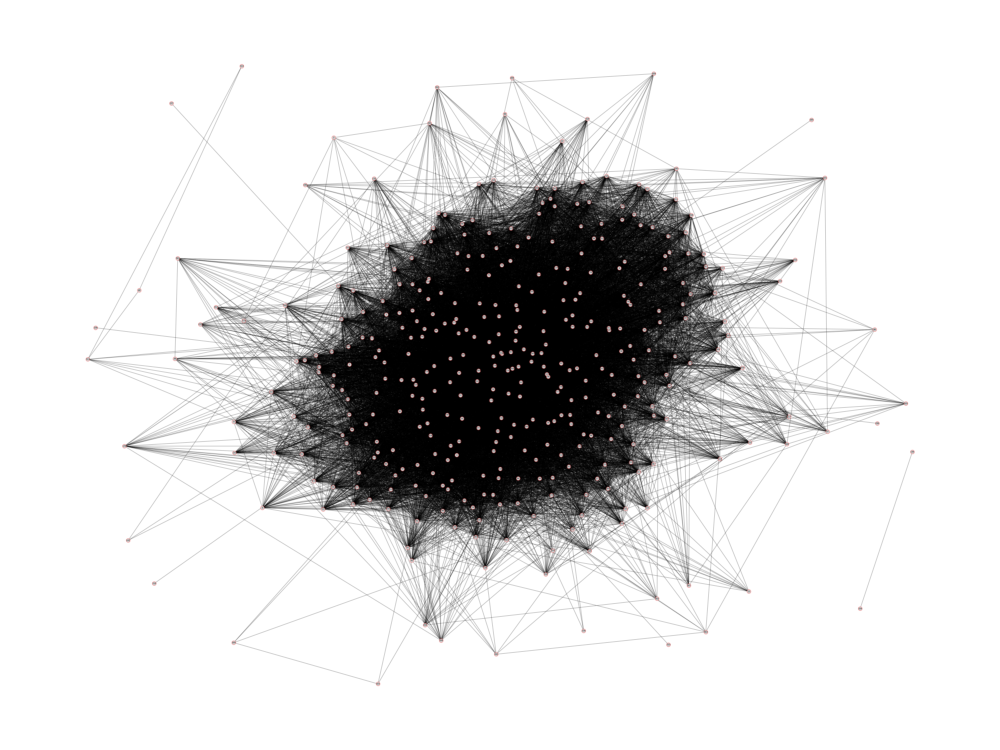

In [11]:
pos = nx.spring_layout(G, k=0.35, iterations=10)

fig = plt.figure(figsize=(80, 60), dpi=80)
nx.draw(G, pos, with_labels=True, node_size=500, edgecolors='red', node_color='lightgray')
fig.show()

In [12]:
"""Python implementation of basic HCS
Implementation of Highly Connected Subgraphs (HCS) clustering which is introduced by "Hartuv, E., & Shamir, R. (2000).
 A clustering algorithm based on graph connectivity. Information processing letters, 76(4-6), 175-18"
 
Based on NetworkX and Numpy
Notation:
    G = Graph
    E = Edge
    V = Vertex
    
    |V| = Number of Vertices in G
    |E| = Number of Edges in G
"""


def highly_connected(G, E):
    """Checks if the graph G is highly connected
    Highly connected means, that splitting the graph G into subgraphs needs more than 0.5*|V| edge deletions
    This definition can be found in Section 2 of the publication.
    :param G: Graph G
    :param E: Edges needed for splitting G
    :return: True if G is highly connected, otherwise False
    """

    return len(E) > len(G.nodes) / 2


def remove_edges(G, E):
    """Removes all edges E from G
    Iterates over all edges in E and removes them from G
    :param G: Graph to remove edges from
    :param E: One or multiple Edges
    :return: Graph with edges removed
    """

    for edge in E:
        G.remove_edge(*edge)
    return G


def HCS(G):
    """Basic HCS Algorithm
    cluster labels, removed edges are stored in global variables
    :param G: Input graph
    :return: Either the input Graph if it is highly connected, otherwise a Graph composed of
    Subgraphs that build clusters
    """

    E = nx.algorithms.connectivity.cuts.minimum_edge_cut(G)

    if not highly_connected(G, E):
        G = remove_edges(G, E)
        sub_graphs = [G.subgraph(c).copy() for c in nx.connected_components(G)]

        if len(sub_graphs) == 2:
            H = HCS(sub_graphs[0])
            _H = HCS(sub_graphs[1])

            G = nx.compose(H, _H)

    return G


def labelled_HCS(G):
    """
    Runs basic HCS and returns Cluster Labels
    :param G: Input graph
    :return: List of cluster assignments for the single vertices
    """

    _G = HCS(G)

    sub_graphs = (G.subgraph(c).copy() for c in nx.connected_components(_G))


    labels = np.zeros(shape=(len(G)), dtype=np.uint16)

    for _class, _cluster in enumerate(sub_graphs, 1):
        c = list(_cluster.nodes)
        labels[c] = _class

    return labels

In [13]:
S = [G.subgraph(c).copy() for c in nx.connected_components(G)]
S

In [14]:
for g in S:
  print(len(g))

377
2
2
2
2


In [15]:
GS = HCS(S[0].copy())

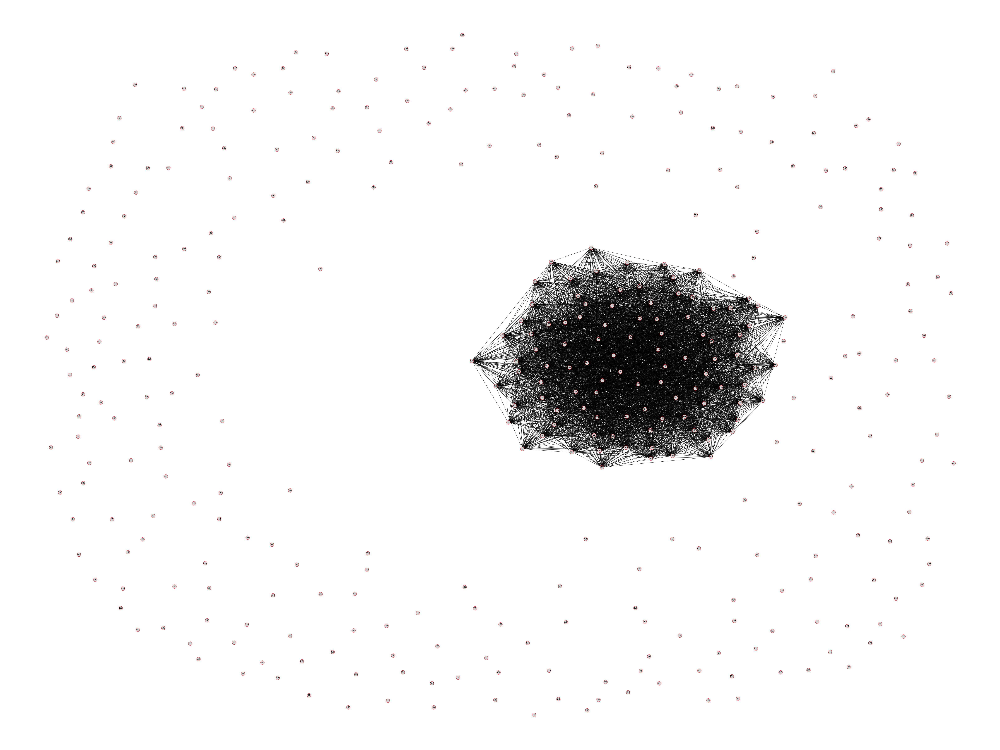

In [16]:
pos = nx.spring_layout(GS, k=0.35, iterations=10)

fig = plt.figure(figsize=(80, 60), dpi=80)
nx.draw(GS, pos, with_labels=True, node_size=500, edgecolors='red', node_color='lightgray')
fig.show()

In [17]:
GSS = [G.subgraph(c).copy() for c in nx.connected_components(GS)]

In [18]:
def is_compatible(cloth, batch):
  for c in batch:
    if c.name in cloth.incompatibles:
      return False
  return True

def _get_compatible_batch(cloth, batches, non_compatible):
  if len(batches) == 0:
    for elem in non_compatible:
      heapq.heappush(batches, elem)
    return 0, 0, set()
  order, batch_time, batch = heapq.heappop(batches)
  if is_compatible(cloth, batch):
    for elem in non_compatible:
      heapq.heappush(batches, elem)
    return order, batch_time, batch
  non_compatible.append((order, batch_time, batch))
  return _get_compatible_batch(cloth, batches, non_compatible)

def get_compatible_batch(cloth, batches):
  return _get_compatible_batch(cloth, batches, [])

In [19]:
def process(clothes):
  batches = []
  for cloth in clothes:
    order, batch_time, batch = get_compatible_batch(cloth, batches)
    if cloth.time > batch_time:
      batch_time = cloth.time
    batch.add(cloth)
    heapq.heappush(batches, (-batch_time, batch_time, batch))
  return batches

In [20]:
def results(batches):
  acc = 0
  for order, time, clothes in batches:
    acc += time
  return len(batches), acc

In [21]:
mainGraphIndex = 0
for i in range(len(GSS)):
  if len(GSS[i]) > 1:
    print(i)
    mainGraphIndex = i


2


In [22]:
usedClothes = nx.get_node_attributes(GSS[mainGraphIndex], "cloth")

In [23]:
unusedClothes = []
for c in clothes:
  if c.name not in usedClothes:
    unusedClothes.append(c)

In [24]:
usedClothes = list(usedClothes.values())

In [25]:
print(len(usedClothes))
print(len(unusedClothes))

100
285


In [26]:
min_time = float('Inf')
init_batches = []
for i in range(100000):
  s1 = random.sample(usedClothes, len(usedClothes))
  s2 = random.sample(unusedClothes, len(unusedClothes))
  b = process(s1 + s2)
  num, total_time = results(b)
  if total_time < min_time:
    min_time = total_time
    init_batches = b

print(f'number of batches: {len(init_batches)}')
print(f'total time: {min_time}')

number of batches: 23
total time: 387


In [27]:
def write_solution(batches, filename):
  with open(filename, 'w') as file:
    i = 1
    for batch in batches:
      for cloth in batch[-1]:
        file.write(f'{cloth.name} {i}\n')
      i += 1


In [28]:
filename = '/entrega_2.txt'
write_solution(init_batches, filename)

In [29]:
files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [31]:
l = [b[-1] for b in init_batches]
t = []
for b in l:
  for c in b:
    t.append(c)

In [32]:
len(t)

385

In [58]:
colors = nx.algorithms.coloring.greedy_color(G, 'smallest_last')

In [63]:
clothesDict = {c.name: c for c in clothes}
batches = {}
for cloth, color in colors.items():
  batches[color] = batches.get(color, set()) | {clothesDict.get(cloth)}
len(batches)

14

In [66]:
batches = [[v] for v in batches.values()]

In [67]:
len(batches)

14

In [69]:
filename = '/entrega_2.2.txt'
write_solution(batches, filename)

In [70]:
files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>